In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

<h1 style ="padding-bottom: 16px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">■</span> Marketing Analytics Report</h1>
<!-- <h2 style ="font-size:18px; padding-bottom: 13px; color:#666; font-style:italic;">by Yana Gilichinskaya</h2> -->
<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>The objective:</b></span> To explore the relationship between  customer behavior, campaign performance and various customer characteristics. Specifically, investigate the influence of factors like income, demographics, family situations (kids, marital status etc) on spending patterns, campaign responses, and overall customer engagement. The results of this analysis will be helpful in our understanding of how to  effectively reach and engage with different customer audience.</h3>

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">/</span> First Look at the Data</h1>
<ul> 
    <li>Columns/Variables</li>
    <li>Dataset dimensions</li>
    <li>Missing values</li>
    <li>Descriptive statistics</li></ul>

<!-- ▲ -->

In [2]:
mydata = pd.read_csv('marketing analytics/ifood_df.csv')
print(f'Dataset dimensions: {mydata.shape}')

Dataset dimensions: (2205, 39)


In [3]:
mydata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2205 entries, 0 to 2204
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Income                2205 non-null   float64
 1   Kidhome               2205 non-null   int64  
 2   Teenhome              2205 non-null   int64  
 3   Recency               2205 non-null   int64  
 4   MntWines              2205 non-null   int64  
 5   MntFruits             2205 non-null   int64  
 6   MntMeatProducts       2205 non-null   int64  
 7   MntFishProducts       2205 non-null   int64  
 8   MntSweetProducts      2205 non-null   int64  
 9   MntGoldProds          2205 non-null   int64  
 10  NumDealsPurchases     2205 non-null   int64  
 11  NumWebPurchases       2205 non-null   int64  
 12  NumCatalogPurchases   2205 non-null   int64  
 13  NumStorePurchases     2205 non-null   int64  
 14  NumWebVisitsMonth     2205 non-null   int64  
 15  AcceptedCmp3         

In [4]:
mydata.head(5)

,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,marital_Together,marital_Widow,education_2n Cycle,education_Basic,education_Graduation,education_Master,education_PhD,MntTotal,MntRegularProds,AcceptedCmpOverall
0,58138.0,0,0,58,635,88,546,172,88,88,...,0,0,0,0,1,0,0,1529,1441,0
1,46344.0,1,1,38,11,1,6,2,1,6,...,0,0,0,0,1,0,0,21,15,0
2,71613.0,0,0,26,426,49,127,111,21,42,...,1,0,0,0,1,0,0,734,692,0
3,26646.0,1,0,26,11,4,20,10,3,5,...,1,0,0,0,1,0,0,48,43,0
4,58293.0,1,0,94,173,43,118,46,27,15,...,0,0,0,0,0,0,1,407,392,0


In [5]:
round(mydata.describe(), 2).T

,count,mean,std,min,25%,50%,75%,max
Income,2205.0,51622.09,20713.06,1730.0,35196.0,51287.0,68281.0,113734.0
Kidhome,2205.0,0.44,0.54,0.0,0.0,0.0,1.0,2.0
Teenhome,2205.0,0.51,0.54,0.0,0.0,0.0,1.0,2.0
Recency,2205.0,49.01,28.93,0.0,24.0,49.0,74.0,99.0
MntWines,2205.0,306.16,337.49,0.0,24.0,178.0,507.0,1493.0
MntFruits,2205.0,26.40,39.78,0.0,2.0,8.0,33.0,199.0
MntMeatProducts,2205.0,165.31,217.78,0.0,16.0,68.0,232.0,1725.0
MntFishProducts,2205.0,37.76,54.82,0.0,3.0,12.0,50.0,259.0
MntSweetProducts,2205.0,27.13,41.13,0.0,1.0,8.0,34.0,262.0
MntGoldProds,2205.0,44.06,51.74,0.0,9.0,25.0,56.0,321.0


<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">/</span> First Observations</h1>
<ul> <li>Dataset dimensions: (2205, 39)</li>
    <li>No missing values</li><li>Education level is <i>one-hot</i> encoded in several variables</li><li><i>Kidhome</i> vs <i>Teenhome</i> variables are independent from each other</li>
    <li><i>Z_CostContact</i> and <i>Z_Revenue</i> variables are identical across all customers and can be dropped</li><li><i>Age</i> and <i>Income</i> variables are found in absolute numbers (not ranges)</li></ul>
<! -- ▲ -->

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">/</span> Feature Engineering and Data Transformation</h1>
<ul> <li>Drop <i>Z_CostContact</i> and <i>Z_Revenue</i> variables</li>
    <li>Create a new variable <i>Education</i> by cobining multiple Education level variables into one</li>
    <li>Create <i>Age_Range</i> variable based on <i>Age</i></li>
        <li>Create <i>Income_Range</i> variable based on <i>Income</i></li></ul>

In [6]:
mydata = mydata.drop(['Z_CostContact', 'Z_Revenue'], axis=1)

In [7]:

# creating age categories to convert Age to Age Ranges
age_categories = [
    (24, 39, '24-39'),
    (40, 54, '40-54'),
    (55, 74, '55-74'),
    (75, 150, '75+')
]

def categorize_age(age):
    for age_range in age_categories:
        if age_range[0] <= age <= age_range[1]:
            return age_range[2]


mydata['Age_Range'] = mydata['Age'].apply(categorize_age)

In [8]:
# creating income categories to convert Income to Income Ranges
income_categories = {
    'Low': (0, 30000),
    'Lower Middle': (30001, 60000),
    'Upper Middle': (60001, 90000),
    'High': (90001, 1000000)
}

def categorize_income(income):
    for category, (min_income, max_income) in income_categories.items():
        if min_income <= income <= max_income:
            return category

mydata['Income_Range'] = mydata['Income'].apply(categorize_income)


<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">▲</span> Getting to Know the Customers</h1>

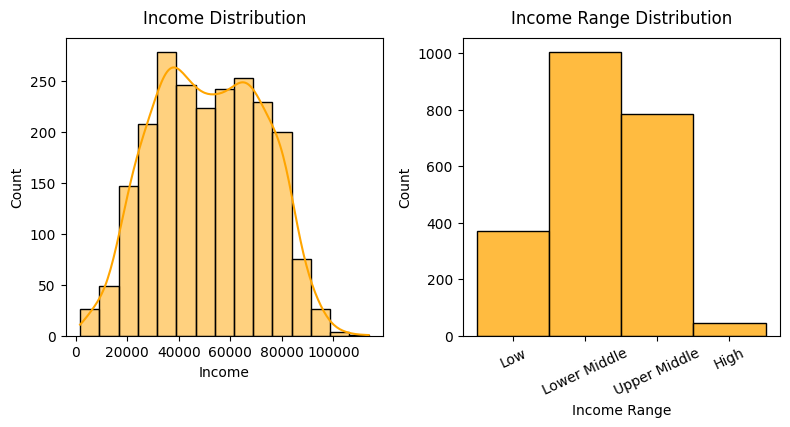

Mean Income: 51622.09
Median Income: 51287.0
Standard Deviation: 20713.06


In [9]:
# Income and Income Range Distribution

custom_order = ['Low', 'Lower Middle', 'Upper Middle', 'High']
mydata['Income_Range'] = pd.Categorical(mydata['Income_Range'], categories=custom_order, ordered=True)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

order = ['Low', 'Lower Middle', 'Upper Middle', 'High']

income_data = mydata['Income']
hist1 = sns.histplot(data=income_data, bins=15, kde=True, color='orange', ax=axes[0])
hist1.set_title('Income Distribution', y=1.02, fontsize=12)
hist1.set_xlabel('Income')

mydata_sorted = mydata.sort_values(by='Income_Range')
hist2 = sns.histplot(data=mydata_sorted, x='Income_Range', color='orange', bins=15, ax=axes[1])
hist2.set_title('Income Range Distribution', y=1.02, fontsize=12)
hist2.set_xlabel('Income Range')

plt.tight_layout()
plt.xticks(rotation=25)
plt.show()

mean_income = income_data.mean()
median_income = income_data.median()
std_dev = income_data.std()

print(f"Mean Income: {round(mean_income, 2)}")
print(f"Median Income: {round(median_income, 2)}")
print(f"Standard Deviation: {round(std_dev, 2)}")


In [10]:
mydata['Income_Range'].value_counts()

Lower Middle    1004
Upper Middle     786
Low              370
High              45
Name: Income_Range, dtype: int64

In [11]:
# Convert to percentage:
total_counts = mydata['Income_Range'].value_counts()
percentage = pd.DataFrame((total_counts / total_counts.sum()) * 100)
rounded_percentage = round(percentage, 2)
rounded_percentage.rename(columns={'Income_Range': 'Percentage'}, inplace=True)
rounded_percentage

,Percentage
Lower Middle,45.53
Upper Middle,35.65
Low,16.78
High,2.04


###### <h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Middle Class Rules: </b></span>Most customers out of the total of 2205 come from the Lower Middle (~ 45%) and Upper Middle (~ 36%) class households. This makes for ~ 81% of all customers.</h3>


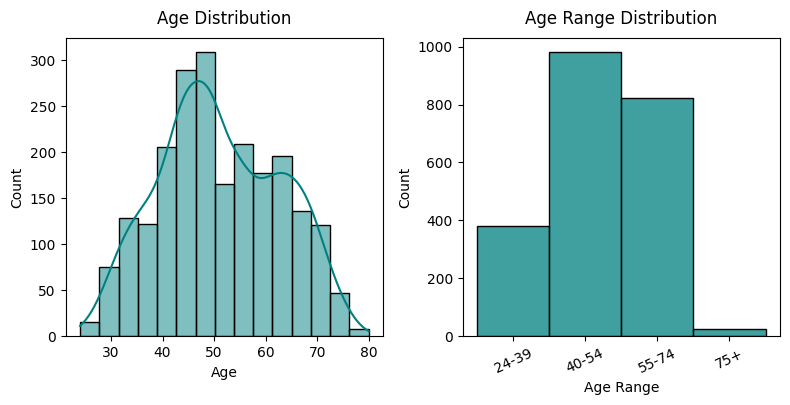

Mean Age: 51.1
Median Age: 50.0
Standard Deviation: 11.71


In [12]:
# Age and Age Range distribution

fig, axes = plt.subplots(1, 2, figsize=(8, 4))

age_data = mydata['Age']
hist1 = sns.histplot(data=age_data, bins=15, kde=True, color='teal', ax=axes[0])
hist1.set_title('Age Distribution', y=1.02, fontsize=12)
hist1.set_xlabel('Age')

mydata_sorted = mydata.sort_values(by='Age_Range')
hist2 = sns.histplot(data=mydata_sorted, x='Age_Range', color='teal', bins=15, ax=axes[1])
hist2.set_title('Age Range Distribution', y=1.02, fontsize=12)
hist2.set_xlabel('Age Range')

plt.tight_layout()
plt.xticks(rotation=25)
plt.show()

mean_age = age_data.mean()
median_age= age_data.median()
std_dev = age_data.std()

print(f"Mean Age: {round(mean_age,  2)}")
print(f"Median Age: {round(median_age, 2)}")
print(f"Standard Deviation: {round(std_dev, 2)}")

In [13]:
mydata['Age_Range'].value_counts()

40-54    981
55-74    822
24-39    379
75+       23
Name: Age_Range, dtype: int64

In [14]:
total_counts = mydata['Age_Range'].value_counts()
percentage = pd.DataFrame((total_counts / total_counts.sum()) * 100)
rounded_percentage = round(percentage, 2)
rounded_percentage.rename(columns={'Age_Range': 'Customers, %'}, inplace=True)
rounded_percentage

,"Customers, %"
40-54,44.49
55-74,37.28
24-39,17.19
75+,1.04


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Middle Age Rules: </b></span>Most customers out of the total of 2205 come from the 40-54 yo (~ 44%) and 55-74 yo (~ 37%) age groups. This makes for ~ 82% of all customers.</h3>

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">▲</span> Who Spends Most</h1>

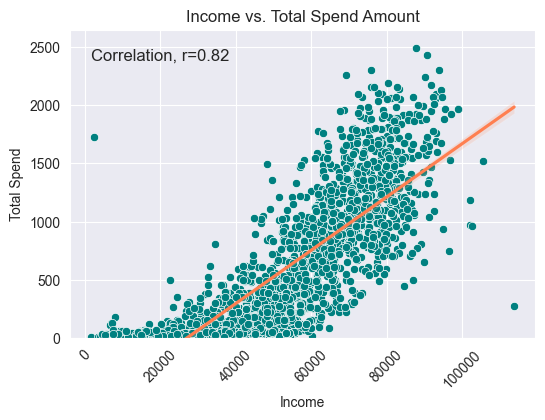

In [49]:
plt.figure(figsize=(6, 4))
sns.scatterplot(x=mydata['Income'], y=mydata['MntTotal'], color='teal')
sns.regplot(x=mydata['Income'], y=mydata['MntTotal'], scatter=False, color='coral')
sns.set_style('darkgrid')

plt.xlabel('Income')
plt.ylabel('Total Spend')
plt.title('Income vs. Total Spend Amount')
plt.xticks(rotation=45)

correlation = round(mydata['MntTotal'].corr(mydata['Income']), 2)
correlation_text = f"Correlation, r={correlation}"

# Limit the y-axis range to not go below 0
plt.ylim(0, None) 

plt.text(mydata['Income'].min(), mydata['MntTotal'].max(), correlation_text, fontsize=12, ha='left', va='top')
plt.show()


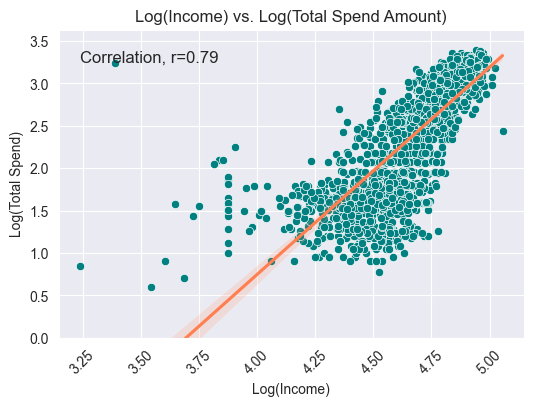

In [16]:
plt.figure(figsize=(6, 4))

x = np.log10(np.array(mydata['Income']))
y = np.log10(np.array(mydata['MntTotal']))

sns.scatterplot(x=x, y=y, color='teal')
sns.regplot(x=x, y=y,  scatter=False, color='coral')
sns.set_style('darkgrid')

correlation = round(np.corrcoef(x[1:], y[1:])[0, 1], 2)
correlation_text = f"Correlation, r={correlation}"

plt.text(min(x), max(y), correlation_text, fontsize=12, ha='left', va='top')
plt.ylim(0, None)


plt.xlabel('Log(Income)')
plt.ylabel('Log(Total Spend)')
plt.title('Log(Income) vs. Log(Total Spend Amount)')
plt.xticks(rotation=45)

plt.show()


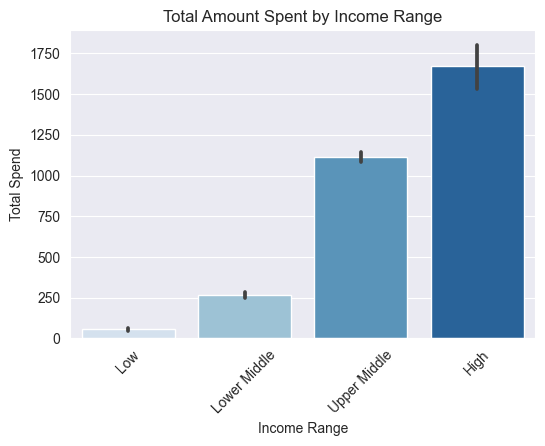

Total Amount Spent by Income Range               MntTotal
Income_Range          
Low              55.19
Lower Middle    267.41
Upper Middle   1115.33
High           1674.33

REMINDER: Income Range Definition
               min_income  max_income
Income_Range                        
Low               1730.0     29999.0
Lower Middle     30015.0     60000.0
Upper Middle     60033.0     90000.0
High             90226.0    113734.0


In [17]:
# mean spending by Income Range

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True). \
    reset_index()['Income_Range']. \
    values

plt.figure(figsize=(6, 4))
sns.barplot(x=mydata['Income_Range'], y=mydata['MntTotal'], palette='Blues', order=order)
sns.set_style('darkgrid')

plt.xlabel('Income Range')
plt.ylabel('Total Spend')
plt.title('Total Amount Spent by Income Range')
plt.xticks(rotation=45)
plt.show()

print('Total Amount Spent by Income Range', round(mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True), 2))

print('')

print('REMINDER: Income Range Definition\n',
      mydata.groupby(by='Income_Range').agg(
          min_income=('Income', 'min'),
          max_income=('Income', 'max')
      ).sort_values(by='min_income', ascending=True)
)


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>More Money, More Spend: </b></span>Surprise! People who have more money spend more! There is a strong positive correlation between the Income of the household and the Money Spend overall (<i>r = 0.82</i>) With a polynomial fit, the correlation coefficient is slightly smaller, (<i>r = 0.79</i>). 

</h3>


In [18]:
# plt.figure(figsize=(6, 4))
# sns.scatterplot(x=mydata['Age'], y=mydata['MntTotal'], color='teal')
# sns.regplot(x=mydata['Age'], y=mydata['MntTotal'], scatter=False, color='coral')
# plt.xlabel('Age')
# plt.ylabel('Total Spend')
# plt.title('Age vs. Total Spend Amount')
# plt.xticks(rotation=45)

# correlation = round(mydata['MntTotal'].corr(mydata['Age']), 2)
# correlation_text = f"Correlation, r={correlation}"

# # Limit the y-axis range to not go below 0
# plt.ylim(0, None) 

# plt.text(mydata['Age'].min(), mydata['MntTotal'].max(), correlation_text, fontsize=12, ha='left', va='top')
# plt.show()

In [19]:
order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True). \
    reset_index()['Age_Range'].values
order

array(['40-54', '24-39', '55-74', '75+'], dtype=object)

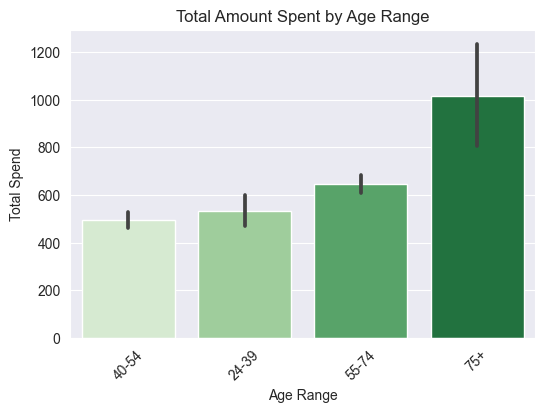

           MntTotal
Age_Range          
40-54         493.0
24-39         534.0
55-74         647.0
75+          1017.0 2


In [20]:
# plotting average spend by Age_Range

plt.figure(figsize=(6, 4))
sns.barplot(x=mydata['Age_Range'], y=mydata['MntTotal'], palette='Greens', order = order)
sns.set_style('darkgrid')

plt.xlabel('Age Range')
plt.ylabel('Total Spend')
plt.title('Total Amount Spent by Age Range')
plt.xticks(rotation=45)
plt.show()

print(round(mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True)), 2)

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Frugal 40-54: </b></span>Curiously, people in the 40-54 yo age category spend the least (493). People who are 24-39 yo spend more (534) than those who are 40-54 yo. The 75+ yo age group spends the most but remember they are relatively small group compared to the rest</h3>



<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">▲</span> Generational Product Spending</h1>

In [21]:
order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True). \
    reset_index()['Age_Range'].values


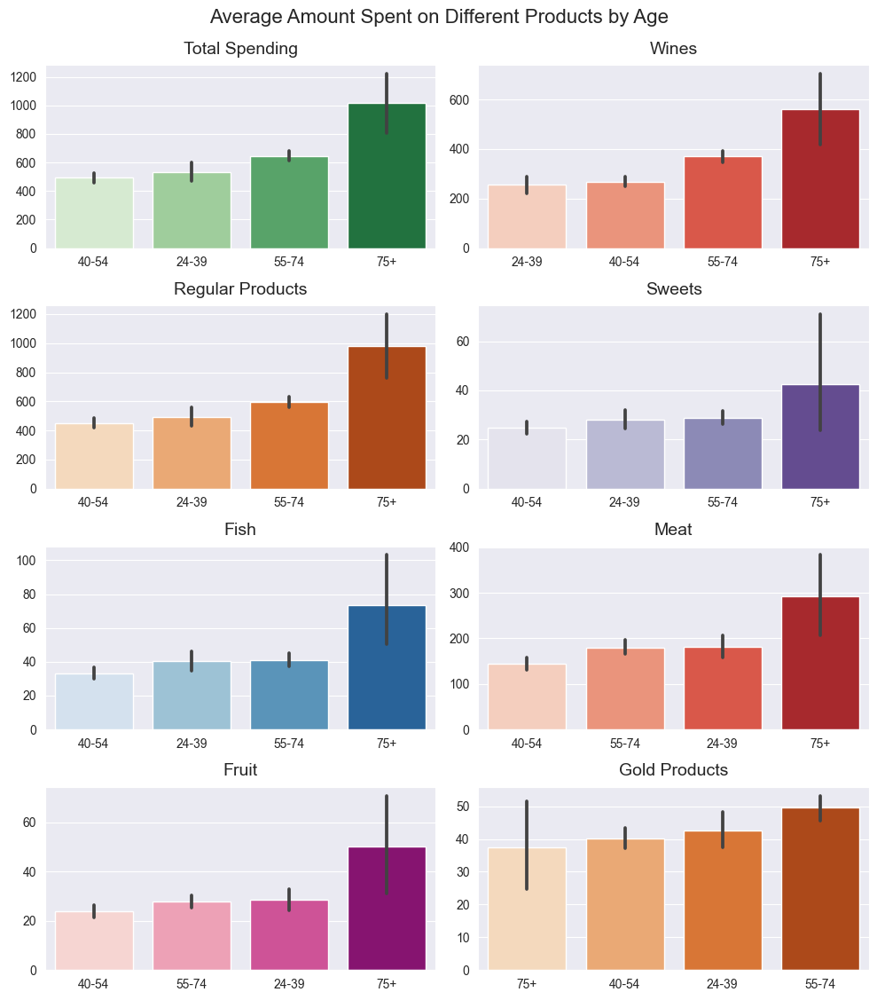

In [22]:
# Create subplots

fig, axes = plt.subplots(4, 2, figsize=(10, 11))

# Define palettes for each subplot
palettes = ['Greys', 'Blues', 'Oranges', 'Greens', 'Reds', 'YlOrBr', 'RdPu', 'Purples']

# Plot 1: Total Spending

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True). \
    reset_index()['Age_Range'].values

sorted_total = mydata.sort_values(by='MntTotal')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntTotal'], order=order, palette=palettes[3], ax=axes[0, 0])
sns.set_style('whitegrid')
axes[0, 0].set_title('Total Spending', y=1.02, fontsize=14)

# Plot 2: Wines

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntWines']]. \
    sort_values(by='MntWines', ascending = True). \
    reset_index()['Age_Range'].values

sorted_wines = mydata.sort_values(by='MntWines')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntWines'], order=order, palette=palettes[4], ax=axes[0, 1])
sns.set_style('whitegrid')

axes[0, 1].set_title('Wines', y=1.02, fontsize=14)

# Plot 3: Regular Products

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntRegularProds']]. \
    sort_values(by='MntRegularProds', ascending = True). \
    reset_index()['Age_Range'].values

sorted_regular = mydata.sort_values(by='MntRegularProds')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntRegularProds'], order=order, palette=palettes[2], ax=axes[1, 0])
sns.set_style('whitegrid')

axes[1, 0].set_title('Regular Products', y=1.02, fontsize=14)

# Plot 4: Sweet Products

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntSweetProducts']]. \
    sort_values(by='MntSweetProducts', ascending = True). \
    reset_index()['Age_Range'].values

sorted_sweet = mydata.sort_values(by='MntSweetProducts')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntSweetProducts'], order=order, palette=palettes[7], ax=axes[1, 1])
sns.set_style('whitegrid')

axes[1, 1].set_title('Sweets', y=1.02, fontsize=14)

# Plot 5: Fish Products
order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntFishProducts']]. \
    sort_values(by='MntFishProducts', ascending = True). \
    reset_index()['Age_Range'].values

sorted_fish = mydata.sort_values(by='MntFishProducts')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntFishProducts'], order=order, palette=palettes[1], ax=axes[2, 0])
sns.set_style('whitegrid')

axes[2, 0].set_title('Fish', y=1.02, fontsize=14)

# Plot 6: Meat Products

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntMeatProducts']]. \
    sort_values(by='MntMeatProducts', ascending = True). \
    reset_index()['Age_Range'].values

sorted_meat = mydata.sort_values(by='MntMeatProducts')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntMeatProducts'], order=order, palette=palettes[4], ax=axes[2, 1])
sns.set_style('whitegrid')

axes[2, 1].set_title('Meat', y=1.02, fontsize=14)

# Plot 7: Fruits

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntFruits']]. \
    sort_values(by='MntFruits', ascending = True). \
    reset_index()['Age_Range'].values

sorted_fruits = mydata.sort_values(by='MntFruits')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntFruits'], order=order, palette=palettes[6], ax=axes[3, 0])
sns.set_style('whitegrid')

axes[3, 0].set_title('Fruit', y=1.02, fontsize=14)

# Plot 8: Gold Products

order = mydata.groupby(by='Age_Range'). \
    mean(numeric_only=True)[['MntGoldProds']]. \
    sort_values(by='MntGoldProds', ascending = True). \
    reset_index()['Age_Range'].values


sorted_gold = mydata.sort_values(by='MntGoldProds')
sns.barplot(x=mydata['Age_Range'], y=mydata['MntGoldProds'], order=order, palette=palettes[2], ax=axes[3, 1])
sns.set_style('whitegrid')

axes[3, 1].set_title('Gold Products', y=1.02, fontsize=14)

for ax in axes.ravel():
    ax.set_xlabel('')
    ax.set_ylabel('')

# Adjust the layout and labels
plt.tight_layout()
plt.suptitle("Average Amount Spent on Different Products by Age", y=1.02, fontsize=16)
plt.show()


In [23]:
# # Define the product categories
# categories = [
#     "MntTotal",
#     "MntWines",
#     "MntRegularProds",
#     "MntSweetProducts",
#     "MntFishProducts",
#     "MntMeatProducts",
#     "MntFruits",
#     "MntGoldProds"
# ]

# # Define the product categories and their corresponding names
# category_names = {
#     "MntTotal": "Total Spending",
#     "MntWines": "Wines",
#     "MntRegularProds": "Regular Products",
#     "MntSweetProducts": "Sweet Products",
#     "MntFishProducts": "Fish Products",
#     "MntMeatProducts": "Meat Products",
#     "MntFruits": "Fruits",
#     "MntGoldProds": "Gold Products"
# }

# # Calculate and add the results for each category
# for category in categories:
#     # Get the category name from the dictionary
#     category_name = category_names.get(category, "N/A")
    
#     mean_by_age_range = mydata.groupby('Age_Range')[category]. \
#         mean(numeric_only=True). \
#         reset_index(). \
#         rename(columns={category: category_name})
    
#     # Sort the results by the mean spending values
#     mean_by_age_range = mean_by_age_range.sort_values(by=category_name, ascending=True)
    
#     print(round(mean_by_age_range, 2))
#     print("\n")


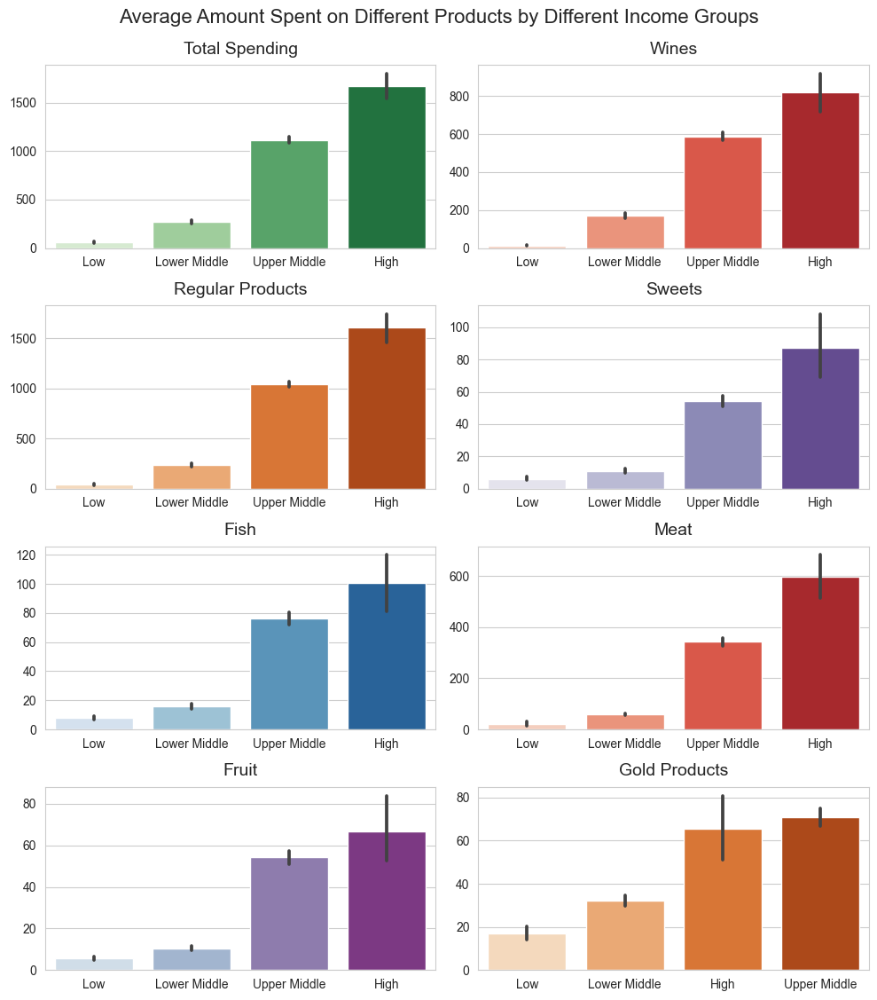

In [24]:
# Create subplots
fig, axes = plt.subplots(4, 2, figsize=(10, 11))

# Define palettes for each subplot
palettes = ['Greens', 'Greens', 'Oranges', 'Reds', 'Purples', 'BuPu', 'Blues', 'Reds']

# Plot 1: Total Spending
order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntTotal']]. \
    sort_values(by='MntTotal', ascending = True). \
    reset_index()['Income_Range'].values

sorted_total = mydata.sort_values(by='MntTotal')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntTotal'], order=order,  palette=palettes[0], ax=axes[0, 0])
sns.set_style('whitegrid')

axes[0, 0].set_title('Total Spending', y=1.02, fontsize=14)

# Plot 2: Wines
order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntWines']]. \
    sort_values(by='MntWines', ascending = True). \
    reset_index()['Income_Range'].values

sorted_wines = mydata.sort_values(by='MntWines')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntWines'], order=order,  palette=palettes[3], ax=axes[0, 1])
sns.set_style('whitegrid')

axes[0, 1].set_title('Wines', y=1.02, fontsize=14)

# Plot 3: Regular Products

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntRegularProds']]. \
    sort_values(by='MntRegularProds', ascending = True). \
    reset_index()['Income_Range'].values

sorted_regular = mydata.sort_values(by='MntRegularProds')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntRegularProds'], order=order,  palette=palettes[2], ax=axes[1, 0])
axes[1, 0].set_title('Regular Products', y=1.02, fontsize=14)
sns.set_style('whitegrid')


# Plot 4: Sweet Products

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntSweetProducts']]. \
    sort_values(by='MntSweetProducts', ascending = True). \
    reset_index()['Income_Range'].values

sorted_sweet = mydata.sort_values(by='MntSweetProducts')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntSweetProducts'], order=order,  palette=palettes[4], ax=axes[1, 1])
sns.set_style('whitegrid')

axes[1, 1].set_title('Sweets', y=1.02, fontsize=14)

# Plot 5: Fish Products

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntFishProducts']]. \
    sort_values(by='MntFishProducts', ascending = True). \
    reset_index()['Income_Range'].values

sorted_fish = mydata.sort_values(by='MntFishProducts')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntFishProducts'], order=order,  palette=palettes[6], ax=axes[2, 0])
sns.set_style('whitegrid')

axes[2, 0].set_title('Fish', y=1.02, fontsize=14)

# Plot 6: Meat Products

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntMeatProducts']]. \
    sort_values(by='MntMeatProducts', ascending = True). \
    reset_index()['Income_Range'].values

sorted_meat = mydata.sort_values(by='MntMeatProducts')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntMeatProducts'], order=order,  palette=palettes[3], ax=axes[2, 1])
sns.set_style('whitegrid')

axes[2, 1].set_title('Meat', y=1.02, fontsize=14)

# Plot 7: Fruits

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntFruits']]. \
    sort_values(by='MntFruits', ascending = True). \
    reset_index()['Income_Range'].values

sorted_fruits = mydata.sort_values(by='MntFruits')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntFruits'], order=order,  palette=palettes[5], ax=axes[3, 0])
sns.set_style('whitegrid')

axes[3, 0].set_title('Fruit', y=1.02, fontsize=14)

# Plot 8: Gold Products

order = mydata.groupby(by='Income_Range'). \
    mean(numeric_only=True)[['MntGoldProds']]. \
    sort_values(by='MntGoldProds', ascending = True). \
    reset_index()['Income_Range'].values

sorted_gold = mydata.sort_values(by='MntGoldProds')
sns.barplot(x=mydata['Income_Range'], y=mydata['MntGoldProds'], order=order,  palette=palettes[2], ax=axes[3, 1])
sns.set_style('whitegrid')

axes[3, 1].set_title('Gold Products', y=1.02, fontsize=14)

for ax in axes.ravel():
    ax.set_xlabel('')
    ax.set_ylabel('')

# Adjust the layout and labels
plt.tight_layout()
plt.suptitle("Average Amount Spent on Different Products by Different Income Groups", y=1.02, fontsize=16)
plt.show()


In [25]:
# # Define the product categories
# categories = [
#     "MntTotal",
#     "MntWines",
#     "MntRegularProds",
#     "MntSweetProducts",
#     "MntFishProducts",
#     "MntMeatProducts",
#     "MntFruits",
#     "MntGoldProds"
# ]

# # Define the product categories and their corresponding names
# category_names = {
#     "MntTotal": "Total Spending",
#     "MntWines": "Wines",
#     "MntRegularProds": "Regular Products",
#     "MntSweetProducts": "Sweets",
#     "MntFishProducts": "Fish",
#     "MntMeatProducts": "Meat",
#     "MntFruits": "Fruit",
#     "MntGoldProds": "Gold Products"
# }

# # Calculate and add the results for each category
# for category in categories:
#     # Get the category name from the dictionary
#     category_name = category_names.get(category, "N/A")
    
#     mean_by_income_range = mydata.groupby('Income_Range')[category]. \
#         mean(numeric_only=True). \
#         reset_index(). \
#         rename(columns={category: category_name})
    
#     # Sort the results by the mean spending values
#     mean_by_income_range = mean_by_income_range.sort_values(by=category_name, ascending=True)
    
#     print(round(mean_by_income_range, 2))
#     print("\n")


In [26]:
# plt.figure(figsize=(6, 4))
# sns.scatterplot(x=mydata['Age'], y=mydata['MntWines'], color='teal')
# sns.regplot(x=mydata['Age'], y=mydata['MntWines'], scatter=False, color='coral')
# plt.xlabel('Age')
# plt.ylabel('Amount Spent on Wine')
# plt.title('Age vs. Amount Spent on Wine')
# plt.xticks(rotation=45)

# correlation = round(mydata['MntWines'].corr(mydata['Age']), 2)
# correlation_text = f"Correlation, r={correlation}"

# # Limit the y-axis range to not go below 0
# plt.ylim(0, None) 

# plt.text(mydata['Age'].min(), mydata['MntWines'].max(), correlation_text, fontsize=12, ha='left', va='top')
# plt.show()

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Income Factor: </b></span>In general, the amount of money people spend corresponds to their income bracket (Low < Lower Middle < Upper Middle < High). That is, people with more money spend more overall and in most product categories: Fish, Meat, Fruit, Sweets, Regular Products, and Wine. The pattern was only disrupted in case of <b>GOLD</b> products where High Income household customers <b>were not</b> in the lead (Upper Middle Class was). REMINDER: There are more LOWER MIDDLE customers but on average they spend <b>MUCH</b> less than their Upper Middle Class neighbors</h3>

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Age Factor: </b></span>On average, people in the 75+ yo age category spend the most whereas the customers from the 40-54 yo age range spend the least</h3>


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Wine: </b></span>There was a very consistent increase in the amount of money spend on Wine across all 4 age groups. 25-39 < 40-54 < 55-74 < 75+. </h3>

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Meat and Fruit: </b></span>The two leading spenders in these product are 75+ and 25-39 yo groups</h3>

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Gold: </b></span>The age pattern for spenders on GOLD products is very different from other product categories. The two leading spenders in GOLD products are 55-74 yo and 25-39 yo age groups, followed by the 40-54 yo group. </h3>


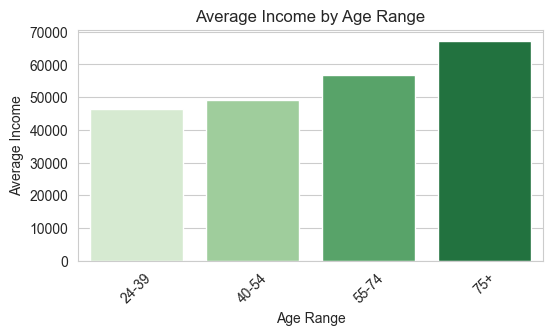

,Age_Range,Income
0,24-39,46260.68
1,40-54,49016.94
2,55-74,56766.24
3,75+,67237.22


In [27]:
# Income as a function of Age Range

average_income_by_age = mydata.groupby('Age_Range')['Income'].mean().reset_index().sort_values(by='Income', ascending=True)

plt.figure(figsize=(6, 3))
sns.barplot(data=average_income_by_age, x='Age_Range', y='Income', palette='Greens')
sns.set_style('whitegrid')


# Customize the chart
plt.title("Average Income by Age Range")
plt.xlabel("Age Range")
plt.ylabel("Average Income")
plt.xticks(rotation=45)


plt.show()
round(average_income_by_age, 2)

In [28]:
correlation = round(mydata['Age'].corr(mydata['Income']), 2)
print(f'Correlation between Age and Income: {correlation}')

Correlation between Age and Income: 0.21


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Income by Age Range: </b></span>In general, older customers come from the households with higher income brackets  (there is hope!). At the same time, the linear correlation between Age and Income is relatively week at ~0.21</h3>

In [29]:
mydata['Total_Kids'] = mydata['Kidhome'] + mydata['Teenhome']

In [30]:
def replace_non_zero_with_one(col):
    new_col = [1 if i != 0 else 0 for i in col]
    return new_col

In [31]:
# income_data = mydata['Income']

# hist = sns.histplot(data=income_data, bins=15, kde=True, color='teal')  

# plt.xlabel('Income')
# plt.xticks(rotation=25)
# plt.ylabel('Frequency')
# plt.title('Income Distribution')
# plt.show()

# # Calculate descriptive statistics
# mean_income = income_data.mean()
# median_income = income_data.median()
# std_dev = income_data.std()

# print(f"Mean Income: {round(mean_income,  2)}")
# print(f"Median Income: {round(median_income, 2)}")
# print(f"Standard Deviation: {round(std_dev, 2)}")

# mydata['Income'].describe()


In [32]:
def create_binary_column(df, column_name):
    new_column_name = 'binary_' + column_name
    df[new_column_name] = df[column_name].apply(lambda x: 1 if x != 0 else 0)
    return df

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">/</span> Marketing Campaign Analysis - Success Rate</h1>

In [33]:
# Overal Campaign Acceptance Rate, i.e percentage of customers who accepted at least one campaign
people_accepted = mydata[(mydata['AcceptedCmpOverall'] > 0)]   
total_people_accepted = (mydata['AcceptedCmpOverall'] > 0).sum()
total_people = len(mydata)
overall_acceptance_rate = round(total_people_accepted/total_people*100, 2)

print(f'Total People: {total_people}')
print(f'Total People Accepted: {total_people_accepted}')
print(f'Overall Campaign Acceptance Rate: {overall_acceptance_rate}%')

Total People: 2205
Total People Accepted: 458
Overall Campaign Acceptance Rate: 20.77%


In [34]:
# creating a list of variables that have Campaign success info
campaign_accepted = [
    'AcceptedCmp1',
    'AcceptedCmp2',
    'AcceptedCmp3',
    'AcceptedCmp4',
    'AcceptedCmp5'
]

In [35]:
#  creating a function to calculate campaign success rate 
def campaign_success(df, campaign_accepted):
    campaign_success_rates = []
    for camp in campaign_accepted:
        success_rate = (df[camp] != 0).sum() / len(df[camp]) * 100
        campaign_number = camp[-1]
        success_rate_campaign = campaign_number, (df[camp] != 0).sum(), round(success_rate, 2)
        campaign_success_rates.append(success_rate_campaign)
 
    return campaign_success_rates

In [36]:
campaign_success_rates = campaign_success(mydata, campaign_accepted) 

In [37]:
campaign_success_rates = pd.DataFrame(campaign_success_rates, columns=['Campaign', 'Number Accepted', 'Acceptance Rate'])
campaign_success_rates

,Campaign,Number Accepted,Acceptance Rate
0,1,142,6.44
1,2,30,1.36
2,3,163,7.39
3,4,164,7.44
4,5,161,7.30


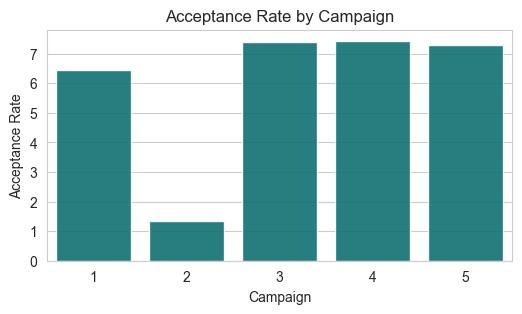

In [38]:
data = campaign_success_rates
plt.figure(figsize=(6, 3))
sns.barplot(data=data, x='Campaign', y='Acceptance Rate', color = 'teal', alpha=0.9)

plt.xlabel('Campaign')
plt.ylabel('Acceptance Rate')
plt.title('Acceptance Rate by Campaign')
plt.show()

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Individual Campaign Success: </b></span>Campaign 2 was the least successfull (1.36% acceptance rate).  The most successful was Campaign 4 (7.44% acceptance rate) closely followed by Campaign 3 (7.39%) and Campaign 5 (7.3%)</h3>

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Overall Campaign Success: </b></span><ul>
<li>Total number of people: 2205</li>
<li>Number of people who accepted at least one campaign: 458</li>
<li>Percentage of people who accepted at least one campaign: 20.77%</li>
    </ul></h3>

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">/</span> Marketing Campaign Analysis - Customers</h1>

In [39]:
# Age_Range and Income_Range of those accepted
people_accepted.groupby(['Age_Range', 'Income_Range']).size()

Age_Range  Income_Range
24-39      Low              10
           Lower Middle     23
           Upper Middle     46
           High             14
40-54      Low              14
           Lower Middle     62
           Upper Middle     86
           High             11
55-74      Low               2
           Lower Middle     51
           Upper Middle    118
           High             12
75+        Low               0
           Lower Middle      4
           Upper Middle      4
           High              1
dtype: int64

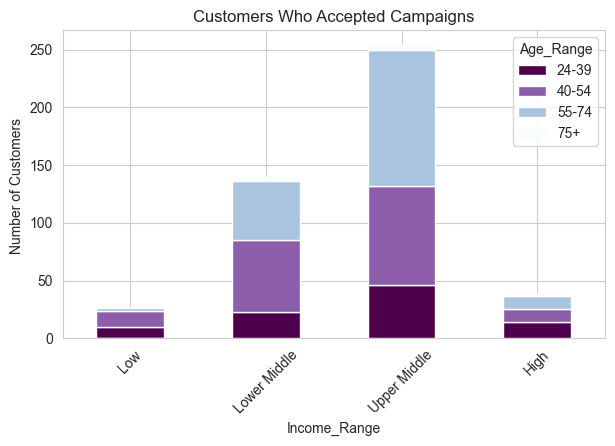

In [40]:

# Count the number of Age_Range groups for each Income_Range
counts = people_accepted.groupby(['Income_Range', 'Age_Range']).size().unstack()

# Create the bar plot
ax = counts.plot(kind='bar', stacked=True, figsize=(7, 4), cmap='BuPu_r')
sns.set_style('darkgrid')
plt.title('Customers Who Accepted Campaigns')
plt.xlabel('Income_Range')
plt.ylabel('Number of Customers ')
plt.xticks(rotation=45)  
plt.show()


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Upper Class Customers more responsive: </b></span>More Upper Middle Class customers responded to the market campaigns than the Lower Middle Class customers (remember, there are more lower middle class than upper middle class customers) </h3>

In [41]:
def count_values(df):
    for col in df.columns:
        breakdown = df[col].value_counts()
        if len(breakdown) < 10:
            print(f'{col}')
            print(breakdown)
            print()

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">▲</span> Total Spend Analysis: Income</h1>

In [42]:
# calculate total amount spent for each income_range
Income_Range_Group_Total = mydata.groupby(by='Income_Range'). \
    sum(numeric_only=True)[['MntTotal']].  \
    sort_values(by='Income_Range', ascending=True)

# convert to percentages and add it as a new column to the dataframe
Income_Range_Group_Total['Percentage']=round((Income_Range_Group_Total/Income_Range_Group_Total.sum())*100, 2)
Income_Range_Group_Total = Income_Range_Group_Total.rename(columns={'MntTotal': 'Total Amount Spent'})


#display the dataframe
Income_Range_Group_Total

,Total Amount Spent,Percentage
Income_Range,,
Low,20420,1.65
Lower Middle,268479,21.64
Upper Middle,876652,70.65
High,75345,6.07


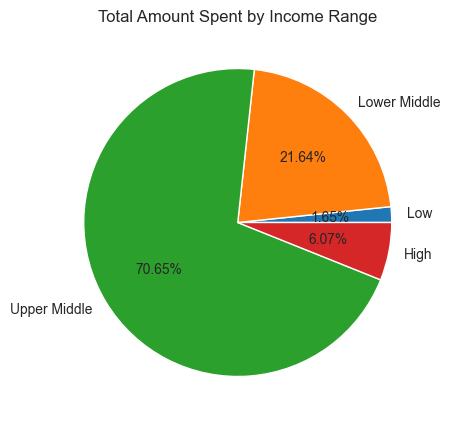

In [43]:
# create a pie chart of the total amount spent by different Income_Ranges
plt.figure(figsize=(5, 5))
plt.pie(Income_Range_Group_Total['Total Amount Spent'], labels=Income_Range_Group_Total.index, autopct='%1.2f%%')
plt.title('Total Amount Spent by Income Range')
plt.show()

<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Uper Middle Class rules even more: </b></span>Customers from the Upper Middle class are responsible for 70.65% of the total amount spent </h3>

<h1 style ="padding-bottom: 15px; border-bottom: 2px solid coral; color:teal;"><span style = "color:coral;">▲</span> Total Spend Analysis: Middle class spenders - Age Factor</h1>

In [44]:
Income_Range_Age_Range_Group_Total = mydata.groupby(by=['Income_Range', 'Age_Range']). \
    sum(numeric_only=True)[['MntTotal']].  \
    sort_values(by=['Income_Range', 'Age_Range'], ascending=True)

Income_Range_Age_Range_Group_Total = Income_Range_Age_Range_Group_Total.rename(columns={'MntTotal': 'Total Amount Spent'})
Income_Range_Age_Range_Group_Total

Total Amount Spent
Income_Range Age_Range                    
Low          24-39                    5877
             40-54                   10388
             55-74                    4155
             75+                         0
Lower Middle 24-39                   29665
             40-54                  116806
             55-74                  117114
             75+                      4894
Upper Middle 24-39                  139700
             40-54                  337481
             55-74                  383341
             75+                     16130
High         24-39                   27195
             40-54                   18649
             55-74                   27129
             75+                      2372

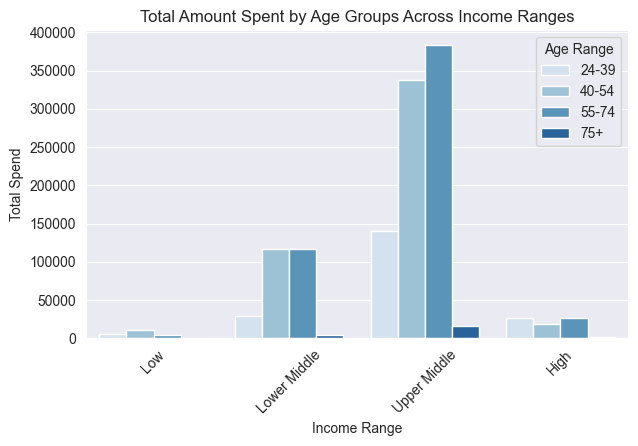

In [45]:
Income_Range_Age_Range_Group_Total = mydata.groupby(['Income_Range', 'Age_Range'])['MntTotal'].sum().reset_index()

plt.figure(figsize=(7, 4))
sns.barplot(data=Income_Range_Age_Range_Group_Total, x='Income_Range', y='MntTotal', hue='Age_Range', palette='Blues')
plt.xlabel('Income Range')
plt.ylabel('Total Spend')
plt.title('Total Amount Spent by Age Groups Across Income Ranges')
plt.xticks(rotation=45)
plt.legend(title='Age Range', loc='upper right')
plt.show()


<h3 style ="line-height:150%; font-size:16px; padding-bottom: 13px; color:#333; font-family: Times New Roman;"><span style="color: teal;"><b>Middle Age Spenders: </b></span>In both Upper Middle class and Lower Middle class, the age groups 40-54 yo and 55-74 yo contribute the most to the total amount spent by customers</h3>

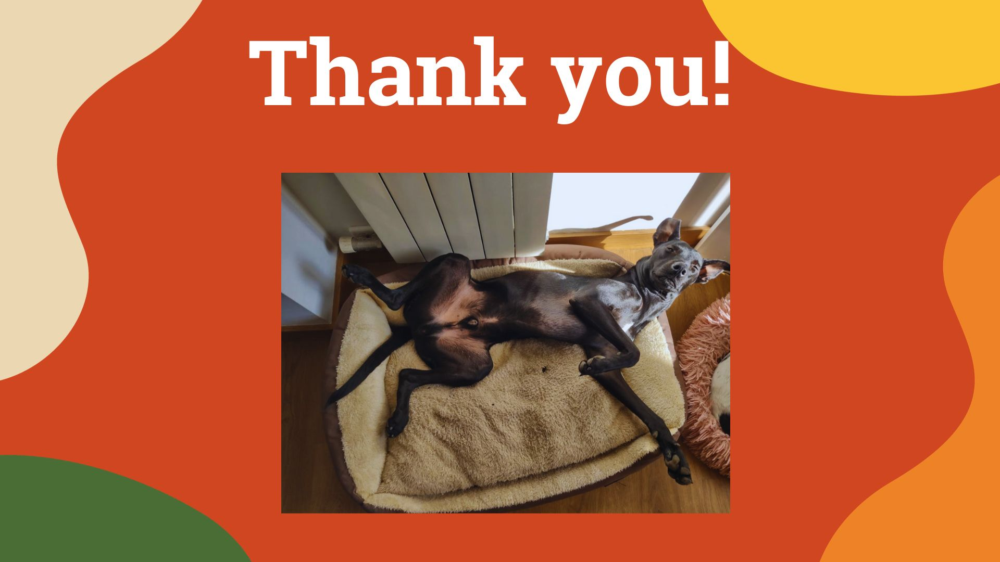

In [46]:
from IPython.display import Image
Image(filename="marketing analytics/Noosha.jpg")

In [60]:
from ipywidgets import interact
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [64]:
import plotly.express as px
from plotly.offline import iplot

In [102]:
mydata.columns

Index(['Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Response', 'Age', 'Customer_Days',
       'marital_Divorced', 'marital_Married', 'marital_Single',
       'marital_Together', 'marital_Widow', 'education_2n Cycle',
       'education_Basic', 'education_Graduation', 'education_Master',
       'education_PhD', 'MntTotal', 'MntRegularProds', 'AcceptedCmpOverall',
       'Age_Range', 'Income_Range', 'Total_Kids'],
      dtype='object')

In [112]:
valid_x_columns = [col for col in mydata.columns if mydata[col].nunique() < 10]
valid_y_columns = ['AcceptedCmpOverall', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', \
'AcceptedCmp5', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', \
                   'NumWebVisitsMonth',  'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntFruits', 'MntGoldProds', 'MntRegularProds']

@interact
def bar_plot(x=valid_x_columns, y=valid_y_columns):
    mydata[x] = mydata[x].astype(str)
    grouped_data = mydata.groupby(x)[y].mean().reset_index()
    fig = px.bar(grouped_data, x=x, y=y, title=f'{y.title()} vs {x.title()}')
    fig.update_layout(width=500, height=500)
    fig.show()

interactive(children=(Dropdown(description='x', options=('Kidhome', 'Teenhome', 'AcceptedCmp3', 'AcceptedCmp4'…

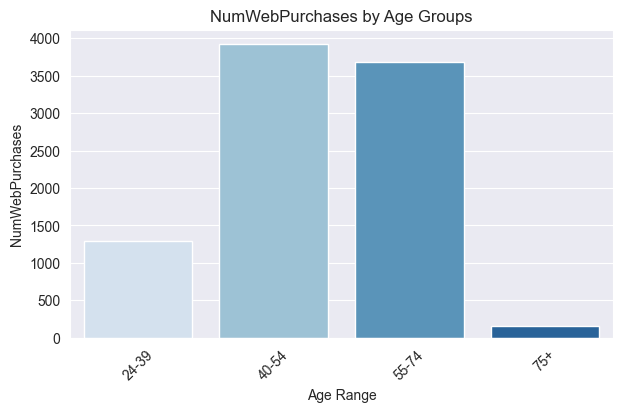

In [113]:
Income_Range_Age_Range_Group_Total = mydata.groupby(['Age_Range'])['NumWebPurchases'].sum().reset_index()

plt.figure(figsize=(7, 4))
sns.barplot(data=Income_Range_Age_Range_Group_Total, x='Age_Range', y='NumWebPurchases', palette='Blues')
plt.xlabel('Age Range')
plt.ylabel('NumWebPurchases')
plt.title('NumWebPurchases by Age Groups')
plt.xticks(rotation=45)
plt.show()


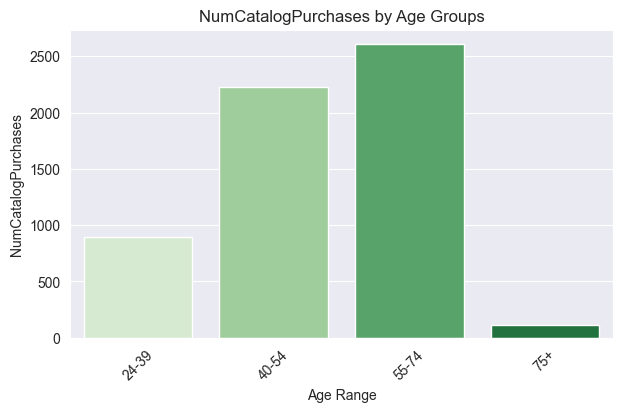

In [114]:
Income_Range_Age_Range_Group_Total = mydata.groupby(['Age_Range'])['NumCatalogPurchases'].sum().reset_index()

plt.figure(figsize=(7, 4))
sns.barplot(data=Income_Range_Age_Range_Group_Total, x='Age_Range', y='NumCatalogPurchases', palette='Greens')
plt.xlabel('Age Range')
plt.ylabel('NumCatalogPurchases')
plt.title('NumCatalogPurchases by Age Groups')
plt.xticks(rotation=45)
plt.show()


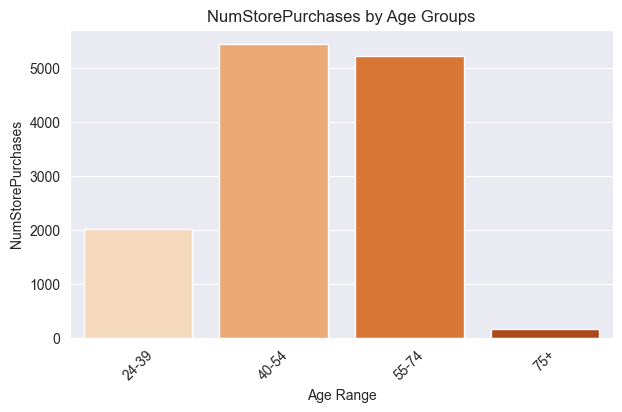

In [115]:
Income_Range_Age_Range_Group_Total = mydata.groupby(['Age_Range'])['NumStorePurchases'].sum().reset_index()

plt.figure(figsize=(7, 4))
sns.barplot(data=Income_Range_Age_Range_Group_Total, x='Age_Range', y='NumStorePurchases', palette='Oranges')
plt.xlabel('Age Range')
plt.ylabel('NumStorePurchases')
plt.title('NumStorePurchases by Age Groups')
plt.xticks(rotation=45)
plt.show()


Uncomment and run the below cell if needed. You can also do this from the command line. If in Jupyter lab, [check out the instructions for that environment](https://ipywidgets.readthedocs.io/en/stable/user_install.html). 

In [ ]:
#!pip install -U -q ipywidgets
#!jupyter nbextension enable --py widgetsnbextension

These are the other imports will use. 

In [ ]:
# Standard Data Science Helpers
import numpy as np
import pandas as pd
import scipy

import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)

import cufflinks as cf
cf.go_offline(connected=True)
cf.set_config_file(colorscale='plotly', world_readable=True)

# Extra options
pd.options.display.max_rows = 30
pd.options.display.max_columns = 25

# Show all code cells outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
import os
from IPython.display import Image, display, HTML

In [ ]:
from IPython.display import HTML
HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

## Data

For this project, we'll work with a sample dataset, which stores the results of a survey related to animal health (e.g.: foot and mouth disease).

In [ ]:
df = pd.read_csv('FMD_Survey1_clean-1.csv')
df.dropna()
df.head()

In [ ]:
df.describe()

# Simple Widgets

Let's get started using some widgets! We'll start off pretty simple just to see how the interface works.

In [ ]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [ ]:
@interact
def show_recs_more_than(column=list(df.select_dtypes('number').columns), 
                          x=(50, 80, 1)):
    display(HTML(f'<h2>Showing records with more than {x} {column}<h2>'))
    display(df.loc[df[column] > x, ['age_respondent', 'farm_years', 'n_cattle']])

# Image Explorer

Let's see another quick example of creating an interactive function. This one allows us to display images from a folder.

In [ ]:
fdir = 'cows/'

@interact
def show_images(file=os.listdir(fdir)):
    display(Image(fdir+file))

You could use this for example if you have a survey column with images.

# Dataframe Explorer

Let's look at a few more examples of using widgets to explore data. Here we create a widget that quickly lets us find correlations between columns.

In [ ]:
@interact
def correlations(column1=list(df.select_dtypes('number').columns), 
                 column2=list(df.select_dtypes('number').columns)):
    print(f"Correlation: {df[column1].corr(df[column2])}")

Here's one to describe a specific column.

In [ ]:
@interact
def describe(column=list(df.columns)):
    print(df[column].describe())

# Interactive Widgets for Plots

We can use the same basic approach to create interactive widgets for plots. This expands the capabilities of the already powerful plotly visualization library.

In [ ]:
@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:]):
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), title=f'{y.title()} vs {x.title()}')

Let's add some options to control the column scheme.

In [ ]:
@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 

             title=f'{y.title()} vs {x.title()}',
            theme=theme, colorscale=colorscale)

The next plot lets us choose the grouping category for the plot. 

In [ ]:
df['binned_number_animals_last_fmd'] = pd.cut(df['number_animals_last_fmd'], bins=range(0, 35, 5))
df['binned_number_animals_last_fmd'] = df['binned_number_animals_last_fmd'].astype(str)

df['binned_n_cattle'] = pd.cut(df['n_cattle'], bins=range(1, 50, 5))
df['binned_n_cattle'] = df['binned_n_cattle'].astype(str)

@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 categories=['binned_number_animals_last_fmd', 'binned_n_cattle', 'number_animals_last_fmd', 'type'],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             categories=categories, 
             xTitle=x.title(), yTitle=y.title(), 
             title=f'{y.title()} vs {x.title()}',
             theme=theme, colorscale=colorscale)

You may have noticed this plot was a little slow to update. When that is the case, we can use `interact_manual` which only updates the function when the button is pressed.

In [ ]:
from ipywidgets import interact_manual

In [ ]:
@interact_manual
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 categories=['binned_number_animals_last_fmd', 'binned_n_cattle', 'vaccination_fmd', 'affected_above_two_years'],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             categories=categories, 
             xTitle=x.title(), yTitle=y.title(), 
             title=f'{y.title()} vs {x.title()}',
             theme=theme, colorscale=colorscale)

Here we show how to change the color scheme of a correlation matrix.

In [ ]:
cscales = ['Greys', 'YlGnBu', 'Greens', 'YlOrRd', 'Bluered', 'RdBu',
            'Reds', 'Blues', 'Picnic', 'Rainbow', 'Portland', 'Jet',
            'Hot', 'Blackbody', 'Earth', 'Electric', 'Viridis', 'Cividis']

In [ ]:
sub_df=df[['age_respondent', 'vaccination_fmd', 'number_animals_last_fmd', 'affected_above_two_years', 'n_cattle' ]]

In [ ]:
import plotly.figure_factory as ff

corrs = sub_df.corr()

@interact_manual
def plot_corrs(colorscale=cscales):
    figure = ff.create_annotated_heatmap(z = corrs.round(2).values, 
                                     x =list(corrs.columns), 
                                     y=list(corrs.index), 
                                     colorscale=colorscale,
                                     annotation_text=corrs.round(2).values)
    iplot(figure)

# Maps
We can create interactive maps, using the ipyleaflet library.

In [ ]:
import geopandas

In [ ]:
gdf = geopandas.GeoDataFrame(
    df, geometry=geopandas.points_from_xy(df.gps_coordinates_lon, df.gps_coordinates_lat))

In [ ]:
from ipyleaflet import Map, GeoJSON, GeoData, basemaps, Heatmap

In [ ]:
m = Map(basemap=basemaps.OpenTopoMap, center=(-0.3158116,36.0088201), zoom=10)

In [ ]:
geo_data = GeoData(geo_dataframe = gdf,
    style={'color': 'black', 'radius':8, 'fillColor': '#3366cc', 'opacity':0.5, 'weight':1.9, 'dashArray':'2', 'fillOpacity':0.6},
    hover_style={'fillColor': 'red' , 'fillOpacity': 0.2},
    point_style={'radius': 5, 'color': 'red', 'fillOpacity': 0.8, 'fillColor': 'blue', 'weight': 3},
    name = 'Release')

m.add_layer(geo_data)

In [ ]:
m

# More Resources

## Dashboards

https://dataschool.com/how-to-design-a-dashboard/dashboard-design-process/

https://jupyter-dashboards-layout.readthedocs.io/en/latest/using.html

https://www.matillion.com/resources/blog/dashboard-examples-the-good-the-bad-and-the-ugly


## Official docs

https://ipywidgets.readthedocs.io/en/stable/user_guide.html

https://ipyleaflet.readthedocs.io/en/latest/


## Examples

https://towardsdatascience.com/interactive-controls-for-jupyter-notebooks-f5c94829aee6

https://towardsdatascience.com/ipyleaflet-interactive-mapping-in-jupyter-notebook-994f19611e79
